In [16]:
suppressMessages(library(Seurat))
suppressMessages(library(tidyverse))
suppressMessages(library(kableExtra))
library(IRdisplay)
library(ggsci)
suppressMessages(library(viridis))

In [ ]:
seuratobj=readRDS('/mnt/MXMERZ002A/LargeData/seuratobj_1.rds')
ADTmatrix=GetAssayData(seuratobj, slot='counts',assay='ADT')
rownames(ADTmatrix)=gsub('-proteona', '', rownames(ADTmatrix))
adt_assay <- CreateAssayObject(counts = ADTmatrix)
seuratobj[['ADT']]=adt_assay
seuratobj <- NormalizeData(seuratobj, normalization.method = "CLR", margin = 2, assay = "ADT")
saveRDS(seuratobj, '/mnt/MXMERZ002A/LargeData/seuratobj_1.rds', compress=F)

In [89]:
#Classify PR as nonCR
seuratobj@meta.data=seuratobj@meta.data %>% mutate(response=ifelse(remission.after.CAR=='CR', 'CR', 'nonCR'))

In [4]:
seuratobj_PB=seuratobj[,seuratobj$source=='PB']

In [5]:
metasummary=seuratobj@meta.data %>% select(orig.ident, wetlabid, barcode, remission.after.CAR, source) %>% distinct

In [6]:
metasummary=metasummary[str_order(metasummary$orig.ident, numeric=T),]
rownames(metasummary)=NULL
metasummary=metasummary %>% rename('analysisid'='orig.ident')

# Samples overview
## SampleIDs
The analysisid column will be used as the sample identifier in this analysis. It's the concantenation of the patient number, days from apharesis, days post-infusion and cell source. So P1\_0\_-49_PB is patient 1, 0 day from apharesis, 49 days before infusion and from peripheral blood. 

In [7]:
metasummary %>%
  kbl() %>%
  kable_styling() %>%  as.character() %>%
  display_html()

analysisid,wetlabid,barcode,remission.after.CAR,source
P1_0_-49_PB,MXMERZ002A_13,UC0CJGPB01,PD,PB
P1_79_30_BM,MXMERZ002A_01,UC3BCAMC01,PD,BM
P1_79_30_PB,MXMERZ002A_02,UC3BCAPB01,PD,PB
P6_0_-55_PB,MXMERZ002A_07,UC0CEQPB01,PD,PB
P6_86_31_PB,MXMERZ002A_14,UC2XR9PB01,PD,PB
P7_-31_-114_PB,MXMERZ002A_03,UC12HHPB01,CR,PB
P7_110_27_BM,MXMERZ002A_04,UC1QT6MC01,CR,BM
P8_-6_-82_PB,MXMERZ002A_19,UC1QQCPB01,CR,PB
P8_103_27_BM,MXMERZ002A_08,UC1RVXMC01,CR,BM
P8_103_27_PB,MXMERZ002A_20,UC1RVXPB01,CR,PB


## Cell compositions

In [8]:
cellcluster_count=seuratobj@meta.data %>% count(orig.ident, wetlabid, WNN_agg) %>% pivot_wider(names_from = WNN_agg, values_from = n, values_fill = 0) 
cellcluster_count_l2=seuratobj@meta.data %>% count(orig.ident, wetlabid, WNN_l2) %>% pivot_wider(names_from = WNN_l2, values_from = n, values_fill = 0) 

In [9]:
pb_counts=cellcluster_count_l2 %>% filter(grepl('PB$',orig.ident)) %>% select(!c(orig.ident, wetlabid))  %>% colSums(na.rm = T) 
pb_types=names(pb_counts)[pb_counts>0]
bm_counts=cellcluster_count_l2 %>% filter(grepl('BM$',orig.ident)) %>% select(!c(orig.ident, wetlabid)) %>% colSums(na.rm=T)
bm_types=names(bm_counts)[bm_counts>0]

In [10]:
response=seuratobj@meta.data %>% select(orig.ident, remission.after.CAR, days.since.apharesis) %>% distinct

In [11]:
cellcluster_count_l2_pb=cellcluster_count_l2 %>% filter(grepl('PB$',orig.ident)) %>%
select(orig.ident, one_of(pb_types)) %>%left_join(response, by='orig.ident') 

In [12]:
cellcluster_count_l2_bm=cellcluster_count_l2 %>% filter(grepl('BM$',orig.ident)) %>%
select(orig.ident, one_of(bm_types)) %>%left_join(response, by='orig.ident') 

In [13]:
cellcluster_count_l2_pb_long=cellcluster_count_l2_pb %>% pivot_longer(2:ASDC) %>% mutate(orig.ident=factor(orig.ident, levels=str_sort(unique(orig.ident), numeric = T)))

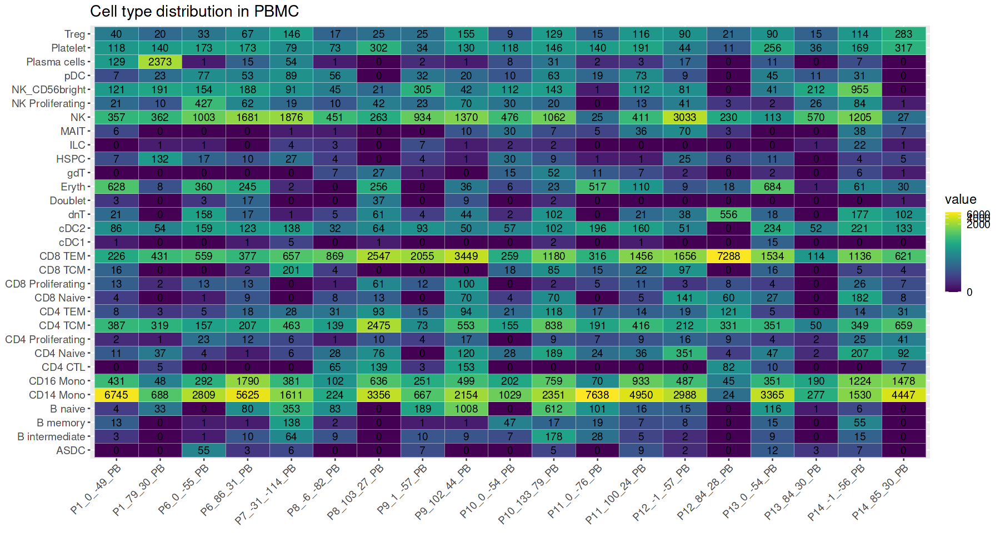

In [17]:
options(repr.plot.width=15, repr.plot.height=8)
ggplot(cellcluster_count_l2_pb_long, aes(x=orig.ident, y=name, fill=value, label=value))+geom_tile(color='white')+ 
  scale_fill_viridis(trans = 'log1p')+geom_text()+ ggtitle('Cell type distribution in PBMC')+
theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1), text = element_text(size=14), axis.title=element_blank())

In [18]:
cellcluster_count_l2_bm_long=cellcluster_count_l2_bm %>% pivot_longer(2:Prog_Mk) %>% mutate(orig.ident=factor(orig.ident, levels=str_sort(unique(orig.ident), numeric = T)))

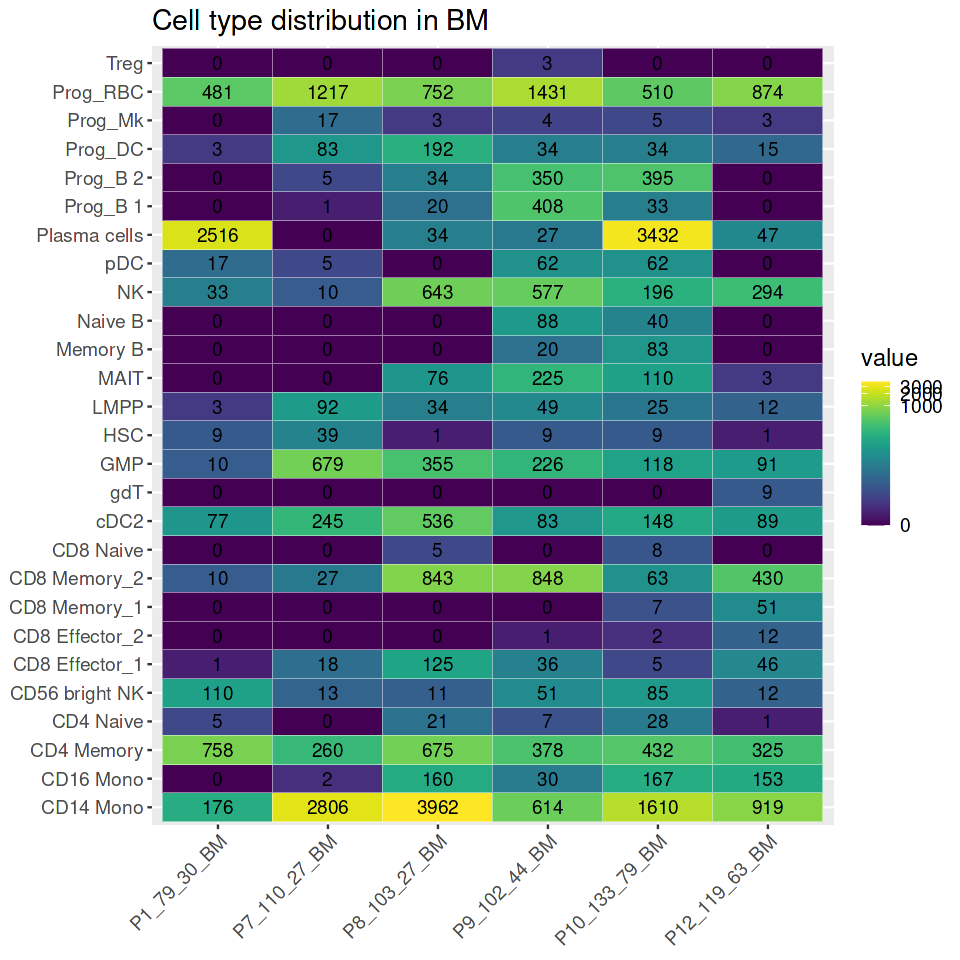

In [19]:
options(repr.plot.width=8, repr.plot.height=8)
ggplot(cellcluster_count_l2_bm_long, aes(x=orig.ident, y=name, fill=value, label=value))+geom_tile(color='white')+ 
  scale_fill_viridis(trans = 'log1p')+geom_text()+ ggtitle('Cell type distribution in BM')+
theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1), text = element_text(size=14), axis.title=element_blank())

In [20]:
reducedim=function(seuratobj_PB){
    seuratobj_PB <- FindVariableFeatures(seuratobj_PB, selection.method = "vst", nfeatures = 2000)
seuratobj_PB <- ScaleData(seuratobj_PB)
seuratobj_PB <- RunPCA(seuratobj_PB, features = VariableFeatures(object = seuratobj_PB))
seuratobj_PB <- RunUMAP(seuratobj_PB, dims = 1:10)

}

In [21]:
seuratobj_PB$orig.ident=factor(seuratobj_PB$orig.ident, levels=str_sort(unique(seuratobj_PB$orig.ident), numeric = T))

In [ ]:
seuratobj_PB=reducedim(seuratobj_PB)

## UMAPs

UMAP visualization of all PBMC samples. 

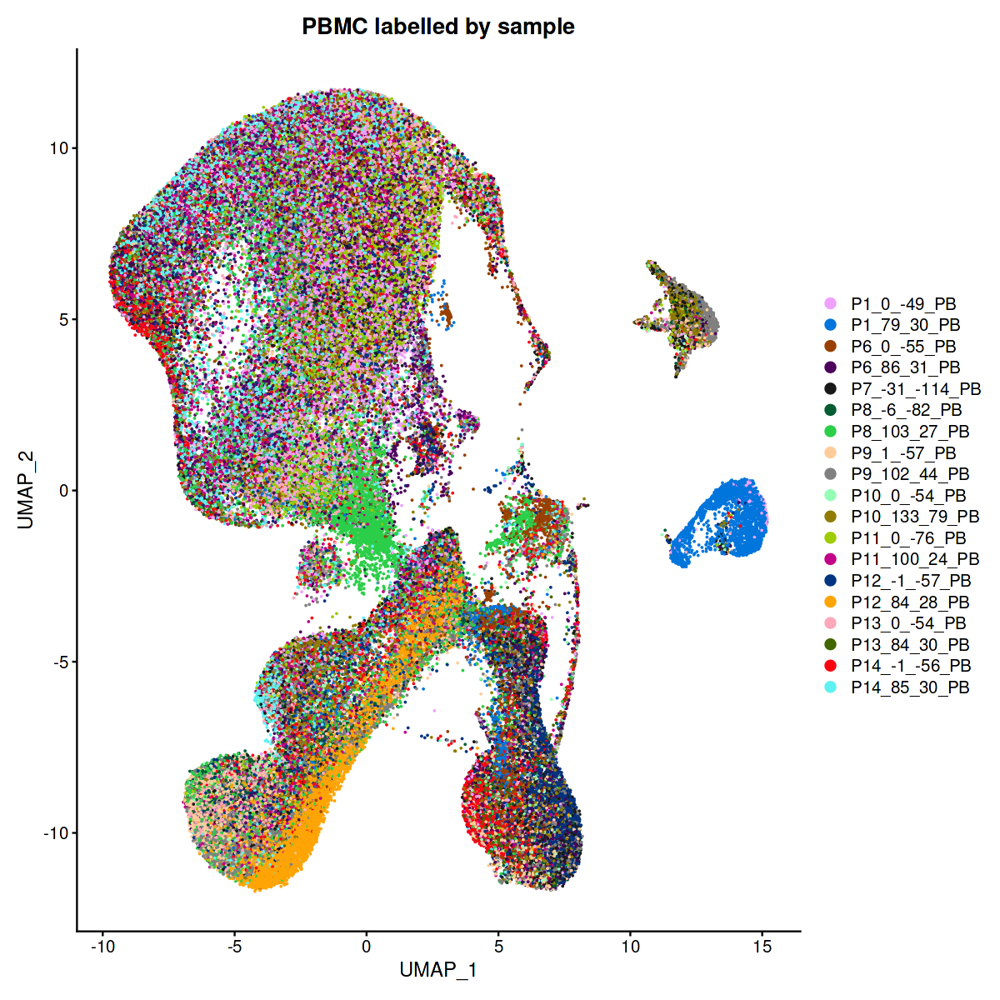

In [23]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(seuratobj_PB, reduction = "umap", cols=DiscretePalette(length(unique(seuratobj_PB$orig.ident))), group.by="orig.ident", raster=FALSE, shuffle =T)+
ggtitle('PBMC labelled by sample')

In [24]:
pbcells=unique(seuratobj$WNN_agg[seuratobj$source=='PB'])
BMcells=unique(seuratobj$WNN_agg[seuratobj$source=='BM'])

In [25]:
commoncells=sort(intersect(pbcells, BMcells))

In [26]:
pbcells_levels=c(commoncells, sort(setdiff(pbcells, commoncells)))
BMcells_levels=c(commoncells, sort(setdiff(BMcells, commoncells)))

In [27]:
seuratobj_PB$WNN_agg=factor(seuratobj_PB$WNN_agg, levels=pbcells_levels)

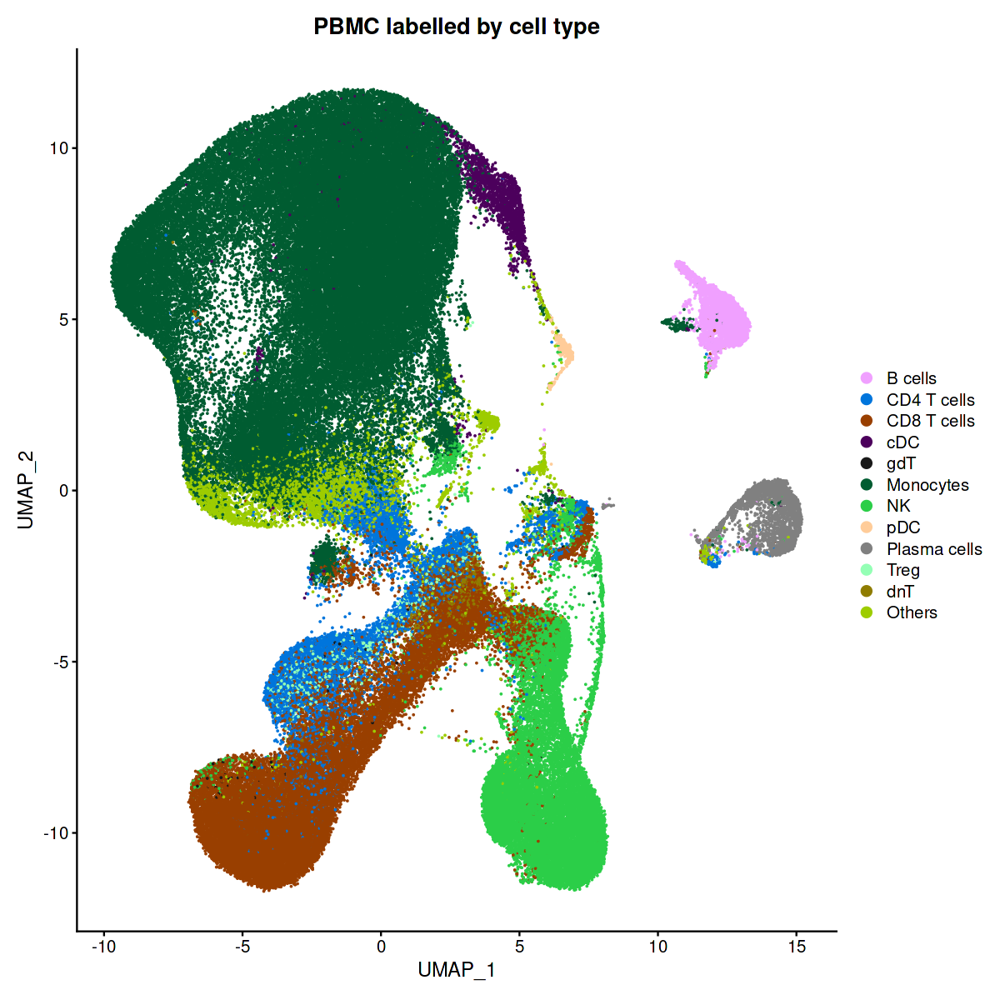

In [28]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(seuratobj_PB, reduction = "umap", cols=DiscretePalette(length(unique(seuratobj_PB$WNN_agg))), group.by="WNN_agg", raster=FALSE, shuffle =T)+
ggtitle('PBMC labelled by cell type')

Cell clusters express the correct ADT markers. 
* CD3E - T cells
* CD4 - CD4+ T cells
* CD8A - CD8+ T cells
* CD11C - Dendritic cells and monocytes
* CD14 - CD14 monocoytes
* CD16 - CD16 monocoytes
* CD19 - B cells
* CD28 - T cells
* CD33 - Myeloid cells
* CD38 - Plasma cells
* CD39 - Monocytes and B cells
* CD56 - NK cells and certain malignant plasma cells
* CD94 - NK cells
* CD117 - Progenitor cells
* CD123 - pDCs
* HLA-DR - Antigen presenting cells, activated T cells

In [ ]:
seuratobj_PB <- NormalizeData(seuratobj_PB, normalization.method = "CLR", margin = 2, assay = "ADT")

In [30]:
adt_to_plot=str_sort(c('CD3E', 'CD4', 'CD8A', 'CD11C', 'CD14', 'CD16', 'CD19', 'CD33', 'CD38', 'CD39', 'CD56', 'CD94', 'CD117', 'CD123', 'HLA-DR', 'CD28'), numeric=T)

In [31]:
DefaultAssay(seuratobj_PB)='ADT'

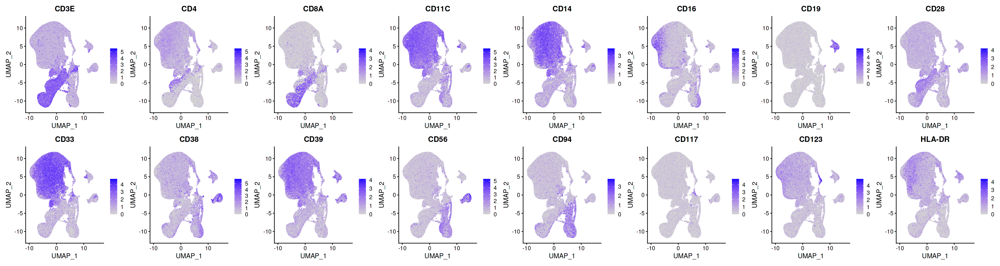

In [33]:
options(repr.plot.width=30, repr.plot.height=8)
DefaultAssay(seuratobj_PB)='ADT'
FeaturePlot(seuratobj_PB, features = adt_to_plot, raster=F, ncol=8)

Cell clusters express the correct RNA markers as well. 
* KLRD1 - NK 
* MS4A1 - B cells
* APOBEC3A - Monocytes
* SSR4 - Plasma cells 
* CD3D - T cells
* FOXP3 - Treg 
* CLEC4C - pDC

In [34]:
rnaplot=c('KLRD1','MS4A1','APOBEC3A','SSR4','CD3D','FOXP3','CLEC4C')

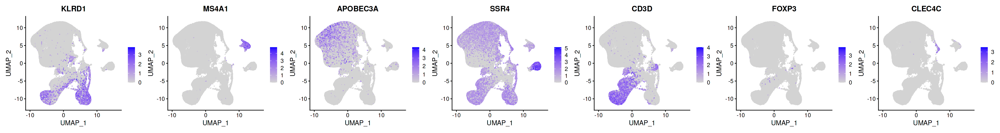

In [35]:
DefaultAssay(seuratobj_PB)='RNA'
options(repr.plot.width=30, repr.plot.height=4)
FeaturePlot(seuratobj_PB, features = rnaplot, raster=F, ncol=7)

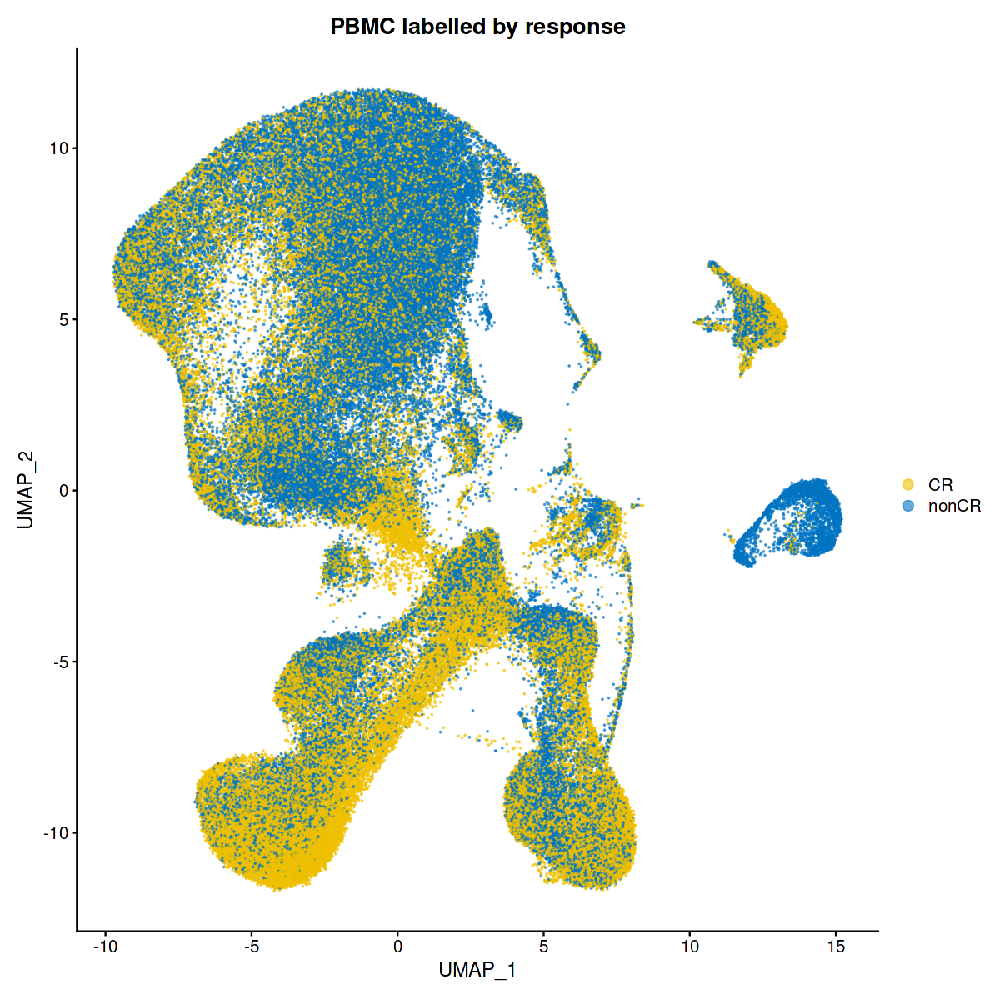

In [36]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(seuratobj_PB, reduction = "umap", cols= pal_jco("default", alpha = 0.6)(10)[2:1], group.by="response", raster=FALSE, shuffle =T)+
ggtitle('PBMC labelled by response')

In [38]:
seuratobj_PB@meta.data=seuratobj_PB@meta.data %>% mutate(timepoint=ifelse(days.since.apharesis<2, 'pre_infusion','post_infusion'))

In [94]:
seuratobj_PB_pre=seuratobj_PB[,seuratobj_PB$days.since.apharesis<2]

In [ ]:
seuratobj_PB_pre=reducedim(seuratobj_PB_pre)

In [96]:
seuratobj_PB_pre$orig.ident=factor(seuratobj_PB_pre$orig.ident, levels=str_sort(unique(seuratobj_PB_pre$orig.ident), numeric = T))

Here we look at pre manufacture and post infusion PBMCs separately.

### Premanufacture PBMC samples

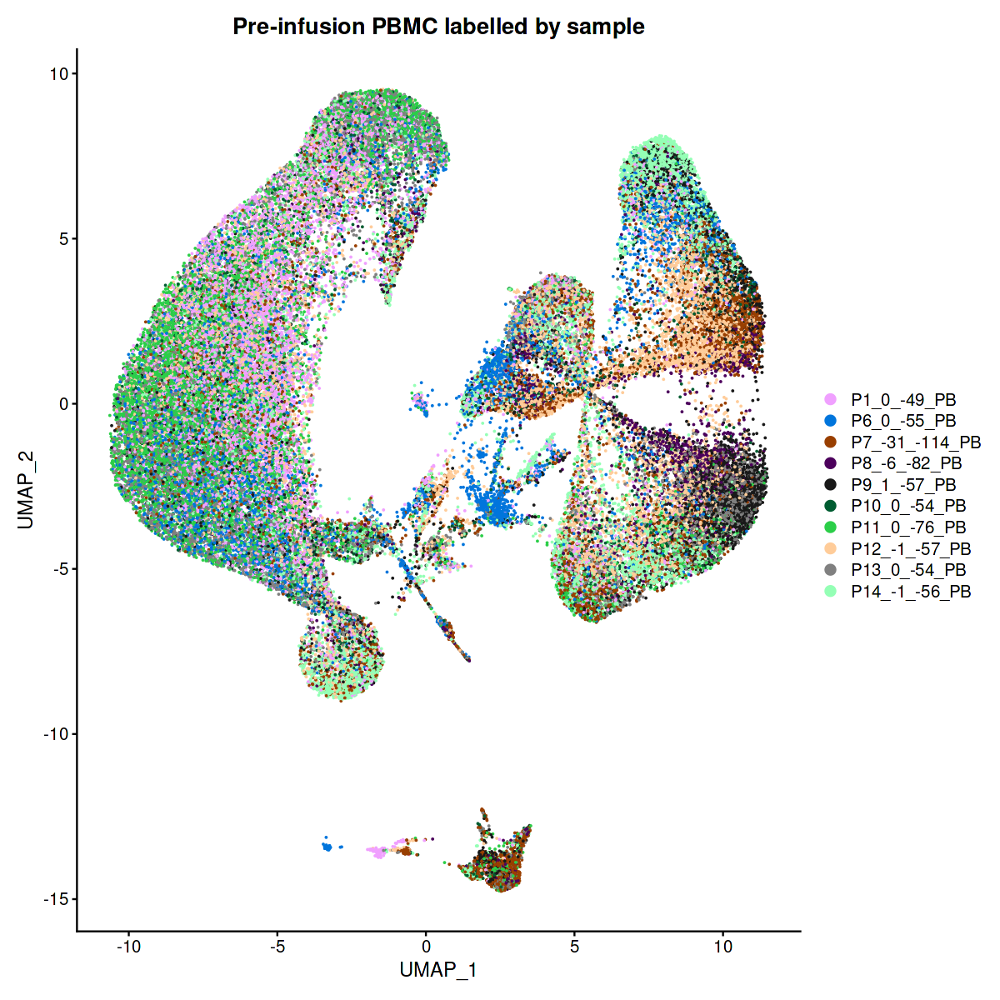

In [42]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(seuratobj_PB_pre, reduction = "umap", cols=DiscretePalette(length(unique(seuratobj_PB_pre$orig.ident))), group.by="orig.ident", raster=FALSE, shuffle =T)+
ggtitle('Pre-infusion PBMC labelled by sample')

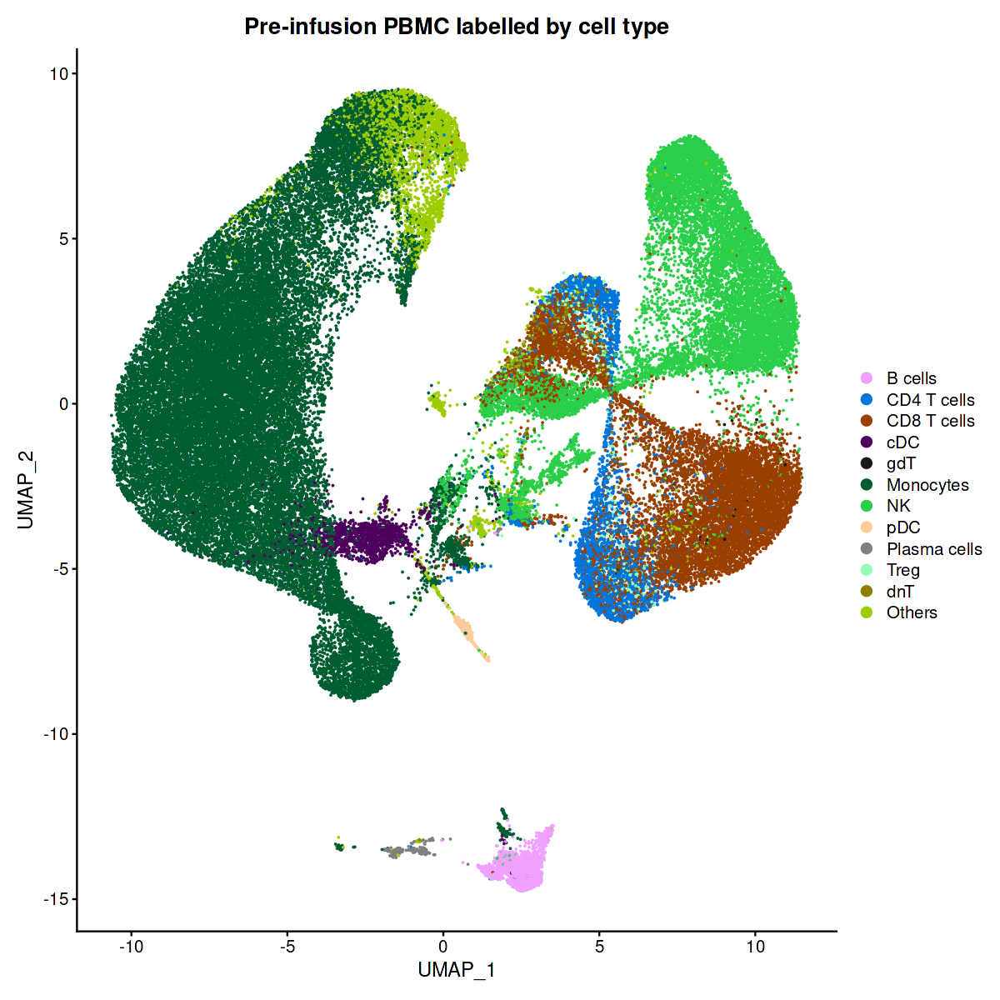

In [43]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(seuratobj_PB_pre, reduction = "umap", cols=DiscretePalette(length(unique(seuratobj_PB_pre$WNN_agg))), group.by="WNN_agg", raster=FALSE, shuffle =T)+
ggtitle('Pre-infusion PBMC labelled by cell type')

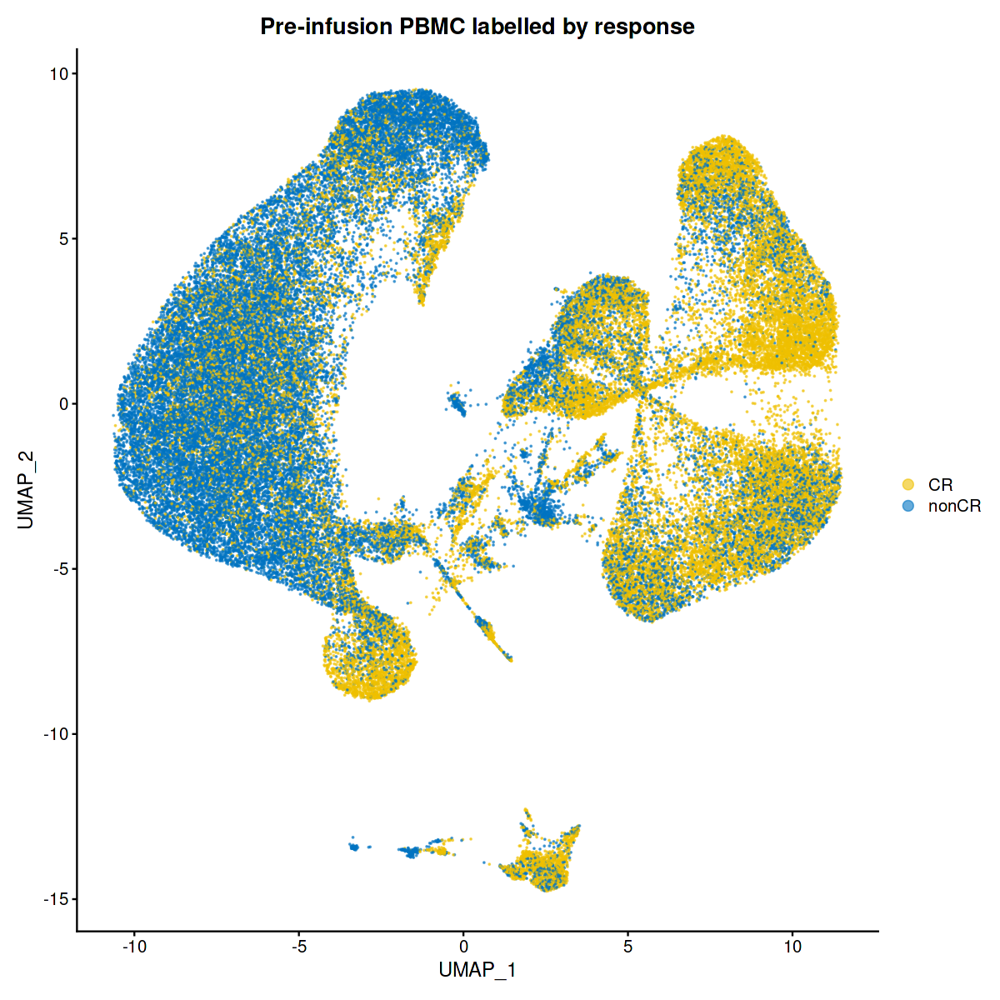

In [97]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(seuratobj_PB_pre, reduction = "umap", cols=pal_jco("default", alpha = 0.6)(10)[2:1], group.by="response", raster=FALSE, shuffle =T)+
ggtitle('Pre-infusion PBMC labelled by response')

In [45]:
rm(seuratobj_PB_pre)

In [ ]:
seuratobj_PB_post=seuratobj_PB[,seuratobj_PB$days.since.apharesis>2]
seuratobj_PB_post=reducedim(seuratobj_PB_post)

### Post infusion PBMC samples

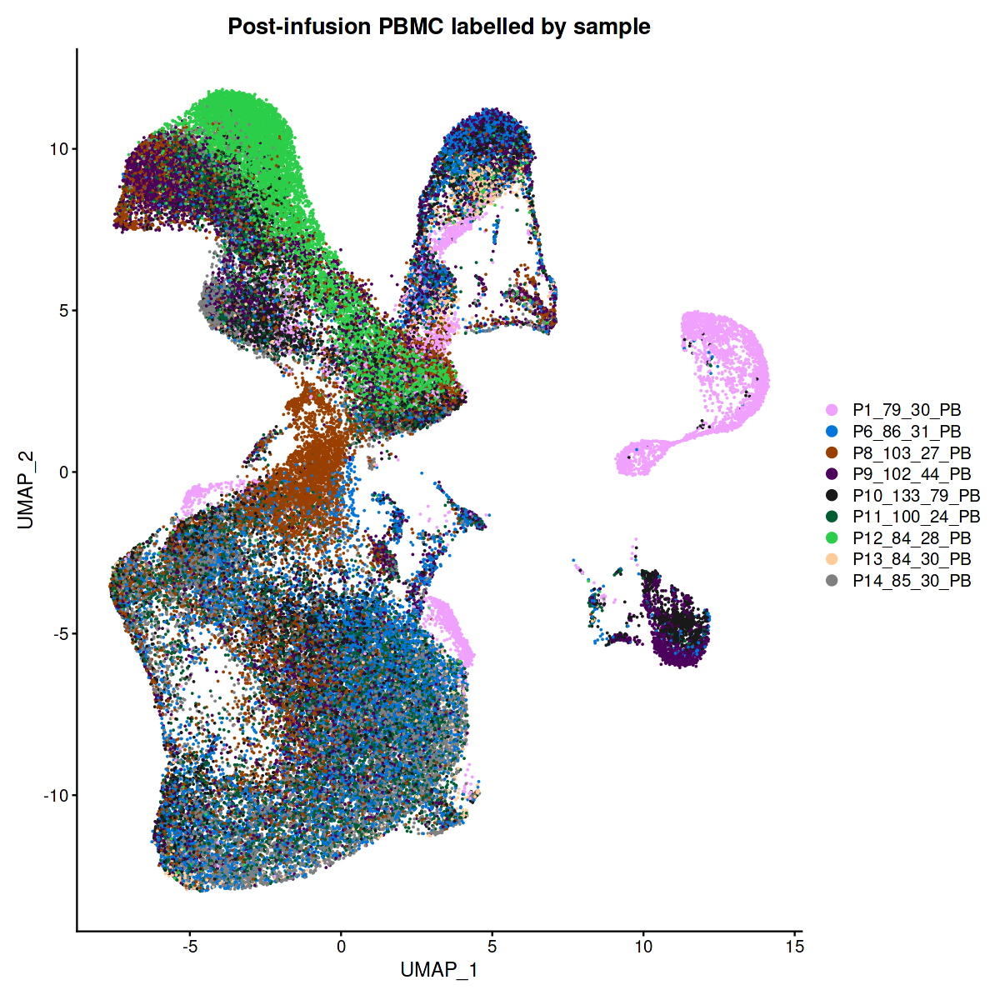

In [47]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(seuratobj_PB_post, reduction = "umap", cols=DiscretePalette(length(unique(seuratobj_PB_post$orig.ident))), group.by="orig.ident", raster=FALSE, shuffle =T)+
ggtitle('Post-infusion PBMC labelled by sample')

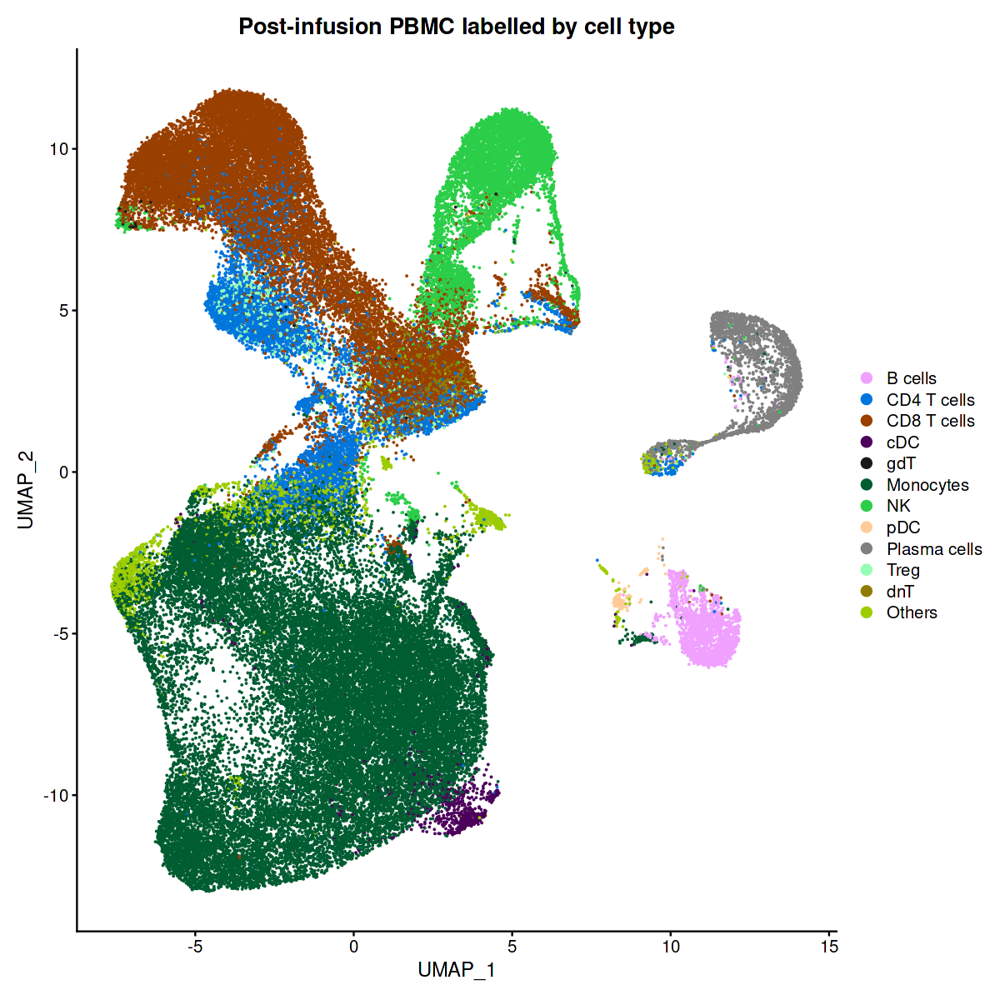

In [48]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(seuratobj_PB_post, reduction = "umap", cols=DiscretePalette(length(unique(seuratobj_PB_post$WNN_agg))), group.by="WNN_agg", raster=FALSE, shuffle =T)+
ggtitle('Post-infusion PBMC labelled by cell type')

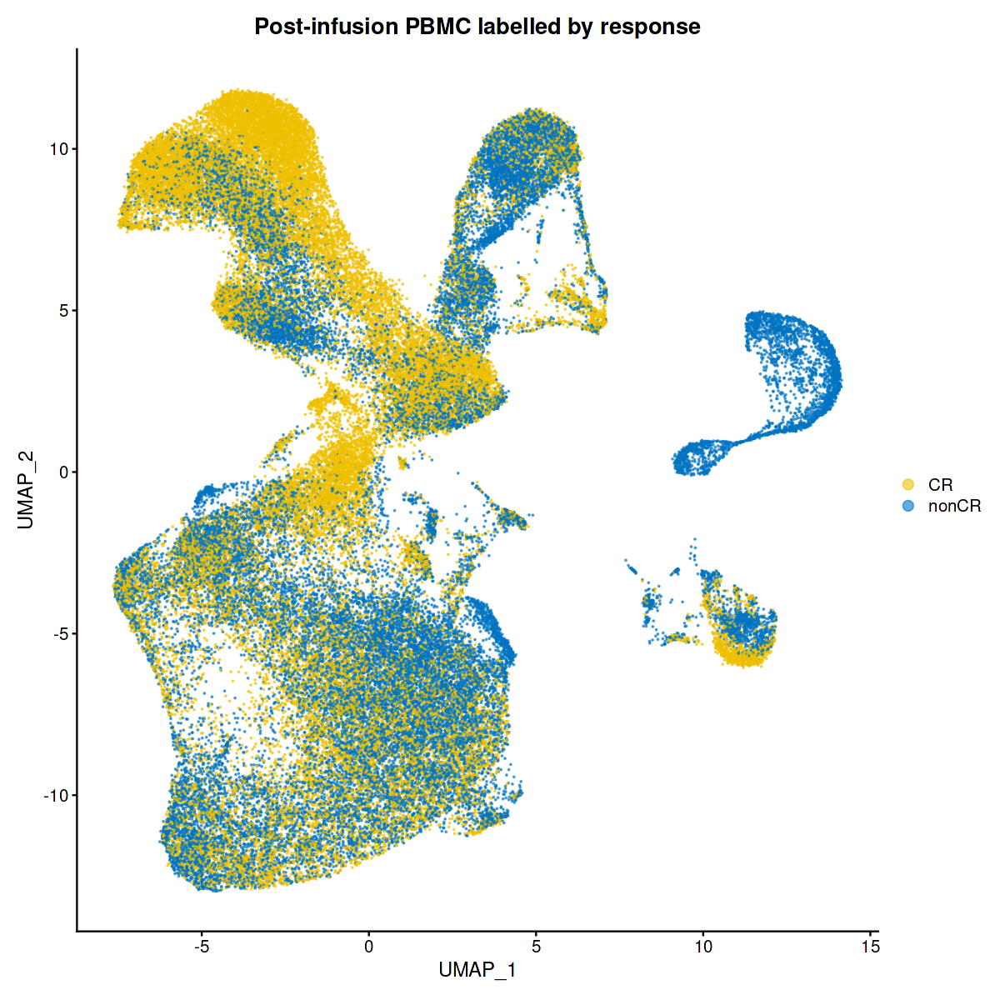

In [68]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(seuratobj_PB_post, reduction = "umap", cols=pal_jco("default", alpha = 0.6)(10)[2:1], group.by="response", raster=FALSE, shuffle =T)+
ggtitle('Post-infusion PBMC labelled by response')

In [72]:
seuratobj_BM=seuratobj[,seuratobj$source=='BM']

In [73]:
#rm(seuratobj)

In [ ]:
seuratobj_BM <- FindVariableFeatures(seuratobj_BM, selection.method = "vst", nfeatures = 2000)
seuratobj_BM <- ScaleData(seuratobj_BM)

In [ ]:
seuratobj_BM <- RunPCA(seuratobj_BM, features = VariableFeatures(object = seuratobj_BM))
seuratobj_BM <- RunUMAP(seuratobj_BM, dims = 1:10)
seuratobj_BM$orig.ident=factor(seuratobj_BM$orig.ident, levels=str_sort(unique(seuratobj_BM$orig.ident), numeric = T))

In [90]:
#Classify PR as nonCR
seuratobj_BM@meta.data=seuratobj_BM@meta.data %>% mutate(response=ifelse(remission.after.CAR=='CR', 'CR', 'nonCR'))

Here we look at BM samples, which are all post infusion.
## Post infusion BM samples

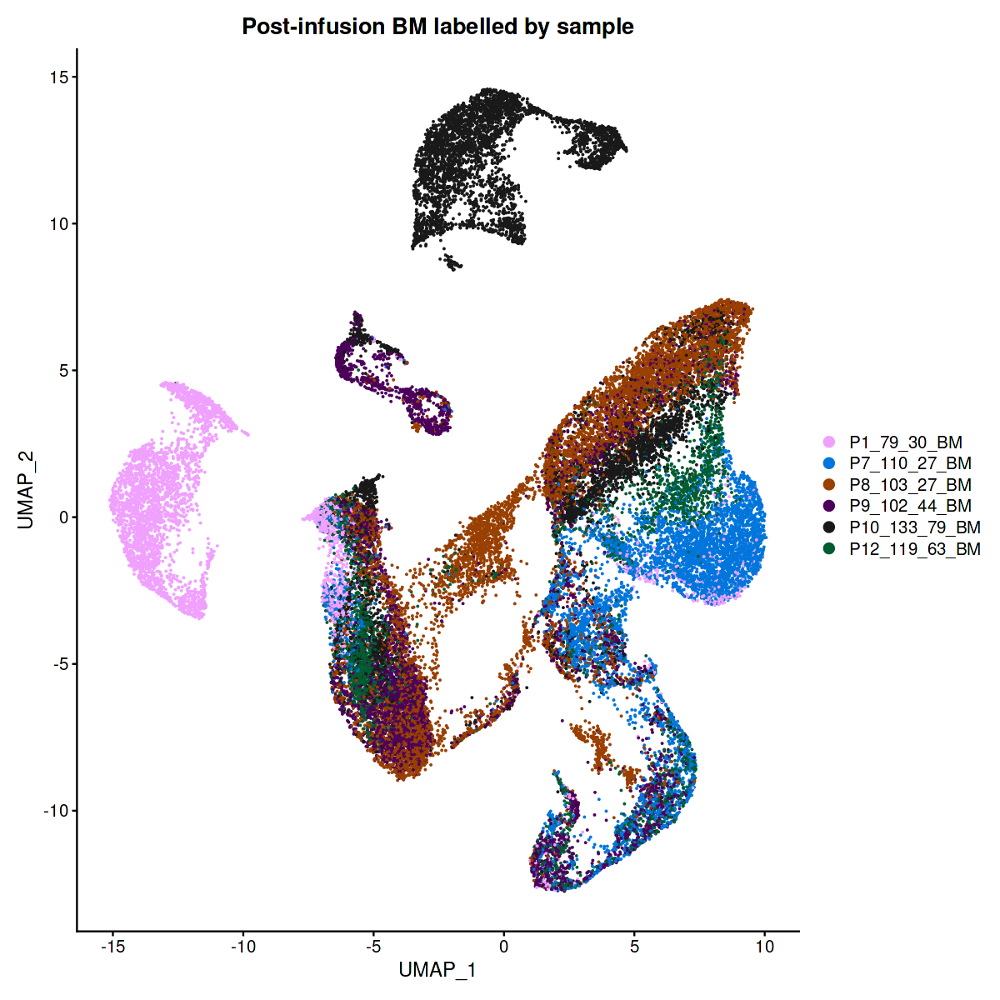

In [76]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(seuratobj_BM, reduction = "umap", cols=DiscretePalette(length(unique(seuratobj_BM$orig.ident))), group.by="orig.ident", raster=FALSE, shuffle =T)+
ggtitle('Post-infusion BM labelled by sample')

In [77]:
seuratobj_BM$WNN_agg=factor(seuratobj_BM$WNN_agg, levels=BMcells_levels)

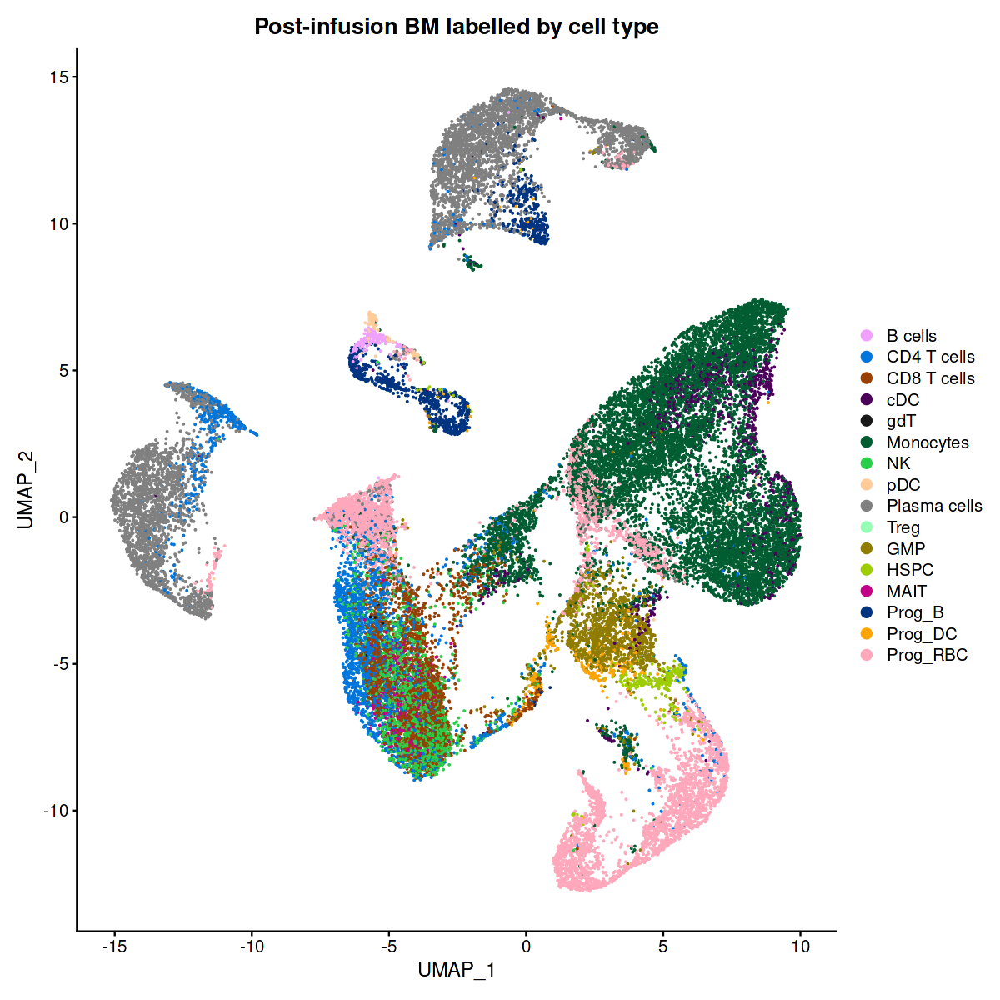

In [78]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(seuratobj_BM, reduction = "umap", cols=DiscretePalette(length(unique(seuratobj_BM$WNN_agg))), group.by="WNN_agg", raster=FALSE, shuffle =T)+
ggtitle('Post-infusion BM labelled by cell type')

In [79]:
ADTmatrix=GetAssayData(seuratobj_BM, slot='counts',assay='ADT')

In [80]:
rownames(ADTmatrix)=gsub('-proteona', '', rownames(ADTmatrix))

In [81]:
adt_assay <- CreateAssayObject(counts = ADTmatrix)

In [82]:
seuratobj_BM[['ADT']]=adt_assay

In [ ]:
seuratobj_BM <- NormalizeData(seuratobj_BM, normalization.method = "CLR", margin = 2, assay = "ADT")

Cell clusters express the correct ADT markers. 
* CD3E - T cells
* CD4 - CD4+ T cells
* CD8A - CD8+ T cells
* CD11C - Dendritic cells and monocytes
* CD14 - CD14 monocoytes
* CD16 - CD16 monocoytes
* CD19 - B cells
* CD28 - T cells
* CD33 - Myeloid cells
* CD38 - Plasma cells
* CD39 - Monocytes and B cells
* CD56 - NK cells and certain malignant plasma cells
* CD94 - NK cells
* CD117 - Progenitor cells
* CD123 - pDCs
* HLA-DR - Antigen presenting cells, activated T cells

The malignant plasma cells for patient 1 express CD56.

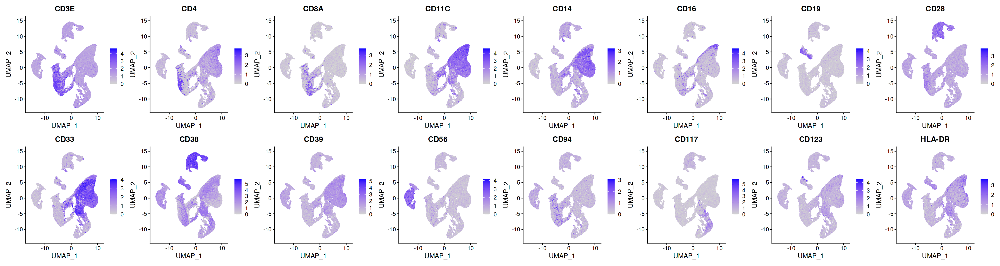

In [84]:
options(repr.plot.width=30, repr.plot.height=8)
#adt_to_plot=str_sort(c('CD3E', 'CD4', 'CD8A', 'CD11C', 'CD14', 'CD16', 'CD19', 'CD33', 'CD38', 'CD39', 'CD56', 'CD94', 'CD123', 'TCRAB', 'HLA-DR', 'CD28'), numeric=T)
DefaultAssay(seuratobj_BM)='ADT'
FeaturePlot(seuratobj_BM, features = adt_to_plot, raster=F, ncol=8)

In [85]:
rnaplot2=c('AVP','LGALS1','HBB','DNTT','CD74')

Cell clusters express the correct RNA markers as well. 
* KLRD1 - NK 
* MS4A1 - B cells
* APOBEC3A - Monocytes
* SSR4 - Plasma cells 
* CD3D - T cells
* FOXP3 - Treg 
* CLEC4C - pDC
* AVP - HSPC
* LGALS1 - GMP
* HBB - Prog_RBC
* DNTT - Prog_B
* CD74 - Prog_DC

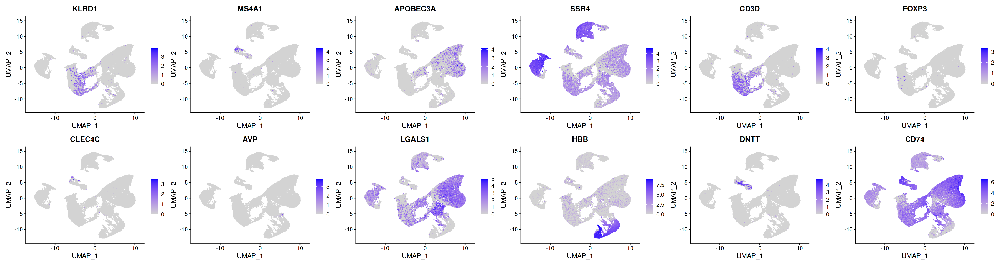

In [86]:
DefaultAssay(seuratobj_BM)='RNA'
options(repr.plot.width=30, repr.plot.height=8)
FeaturePlot(seuratobj_BM, features = c(rnaplot, rnaplot2), raster=F, ncol=6)

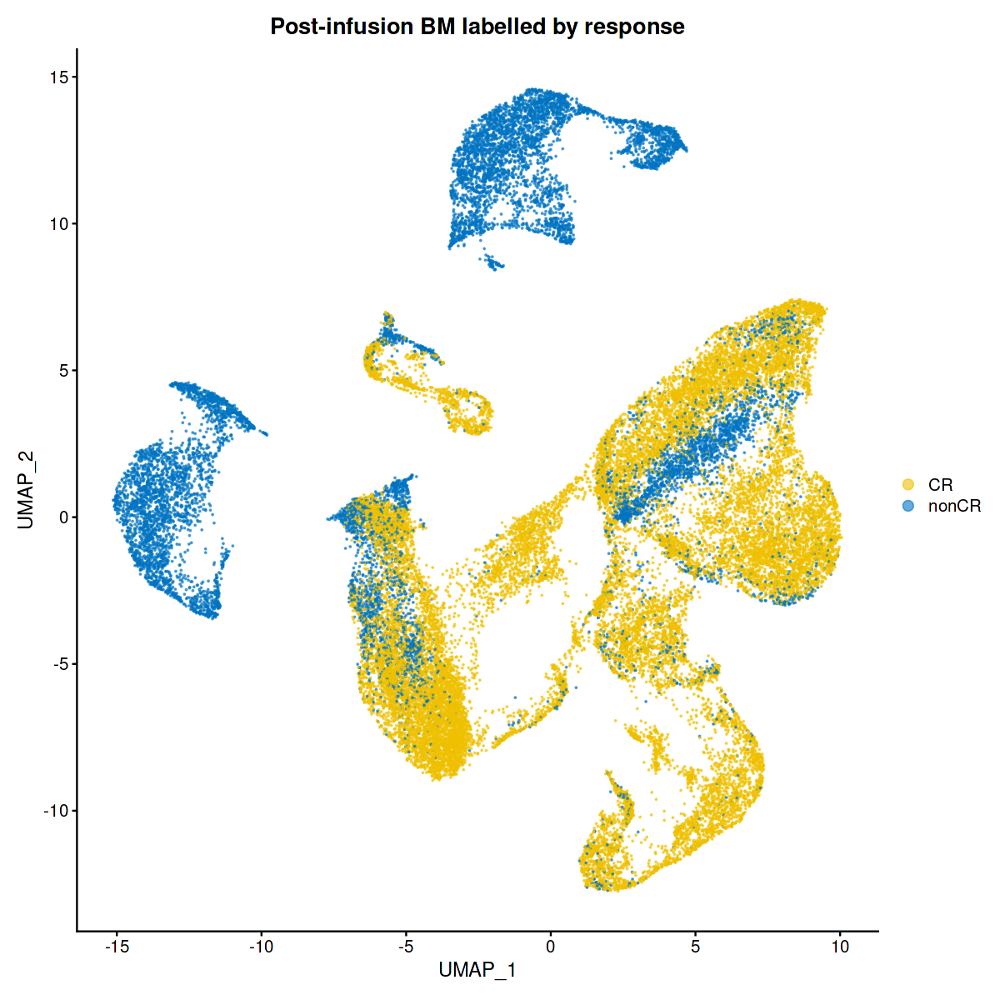

In [91]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(seuratobj_BM, reduction = "umap", cols=pal_jco("default", alpha = 0.6)(10)[2:1], group.by="response", raster=FALSE, shuffle =T)+
ggtitle('Post-infusion BM labelled by response')